# Uncertainty Quantification Grid Operation

In Uncertainty Quantification (UQ), a problem function has parameters whose input is not exactly known. Each uncertain input parameter has a probability distribution. When evaluating the function, we can use the expectation as an approximate solution and the variance gives information about how much impact the uncertainty has on the solution. <br/>
With the `UncertaintyQuantification` grid operation, it is possible to can calculate moments, expectation and variance, and a polynomial chaos expansion (PCE). Input values which are not uncertain need to be fixed in the `Function` object. <br/>
The calculations involve weighted integration, where the integrated functions depend on the values which we want to calculate. For example, we can calculate the expectation and variance with the first and second moment:
$$
\mathrm{E} = \int_{w \in \Omega} f(w) p(w) dw \\
\mathrm{M}_2 = \int_{w \in \Omega} f(w)^2 p(w) dw \\
\mathrm{Var} = \mathrm{M}_2 - \mathrm{E}^2
$$
To reduce the number of problem function evaluations, the adaptive refinement generates a grid which fits well for multiple integrals, for example the first and second moments.
To this end, methods of `UncertaintyQuantification` concatenate relevant functions into a `Function` with multidimensional output. <br/>
`UncertaintyQuantification` supports the single dimension strategy with weighted global grids. In the following examples, the weighted trapezoidal grids are employed.


### Expectation and Variance Calculation

Here is an example for an expectation and variance calculation:

/tmp/ipykernel_18295/1747648627.py:25: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ans[i,j,k] = problem_function([xi,xj,xk])


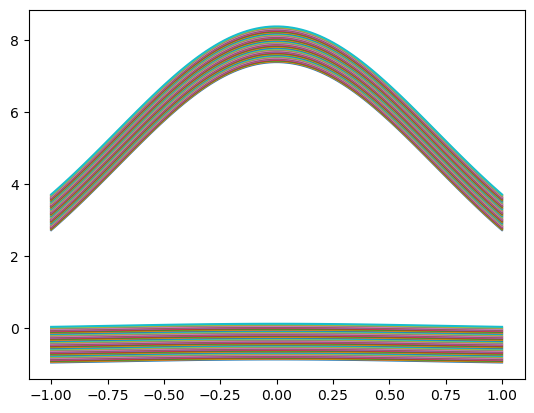

In [1]:
%matplotlib inline
import numpy as np

import sparseSpACE
from sparseSpACE.Function import *
from sparseSpACE.spatiallyAdaptiveSingleDimension2 import *
from sparseSpACE.ErrorCalculator import *
from sparseSpACE.GridOperation import *

# Let's select the three-dimensional discontinuous FunctionUQ
# as problem function and let the input parameters be
# normally distributed
problem_function = FunctionUQ()

size = 100
bounds = [-1,1]
x1 = np.linspace(*bounds, size)
x2 = np.linspace(*bounds, size)
x3 = np.linspace(*bounds, size)

ans = np.zeros((size,size,size))
for i, xi in enumerate(x1):
    for j, xj in enumerate(x2):
        for k, xk in enumerate(x3):
            ans[i,j,k] = problem_function([xi,xj,xk])

import matplotlib.pyplot as plt
for slice in range(size):
    plt.plot(x1, ans[:,slice,slice])


In [2]:
%matplotlib inline
import numpy as np

import sparseSpACE
from sparseSpACE.Function import FunctionUQ
# from sparseSpACE.spatiallyAdaptiveSingleDimension2
# from sparseSpACE.ErrorCalculator import *
from sparseSpACE.GridOperation import UncertaintyQuantification

# Let's select the three-dimensional discontinuous FunctionUQ
# as problem function and let the input parameters be
# normally distributed
problem_function = FunctionUQ()

dim = 3
distributions = [("Normal", 0.2, 1.0) for _ in range(dim)]

# a and b are the weighted integration domain boundaries.
# They should be set according to the distribution.
a = np.array([-np.inf] * dim)
b = np.array([np.inf] * dim)

op = UncertaintyQuantification(problem_function, distributions, a, b)

0 [1, 1, 2] 1.0
1 [1, 2, 1] 1.0
2 [2, 1, 1] 1.0
3 [1, 1, 1] -2.0
Current number of function evaluations 7
combiintegral: [ 2.91854251 13.14536111]
Current error: 32.422446802830244
Contour plot:
Can only plot 2D results
Finished refinement
Refined 2 times
Refinement Graph:


/home/djdaniel/anaconda3/envs/gene_ml/lib/python3.12/site-packages/sparseSpACE/spatiallyAdaptiveSingleDimension2.py:574: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.
  axis.plot(xValues[1:-1], yValues[1:-1], 'bo', markersize=markersize, color="black")
/home/djdaniel/anaconda3/envs/gene_ml/lib/python3.12/site-packages/sparseSpACE/spatiallyAdaptiveSingleDimension2.py:575: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.
  axis.plot([xValues[0], xValues[-1]], [yValues[0], yValues[-1]], 'bo', markersize=markersize, color="black", fillstyle='none')


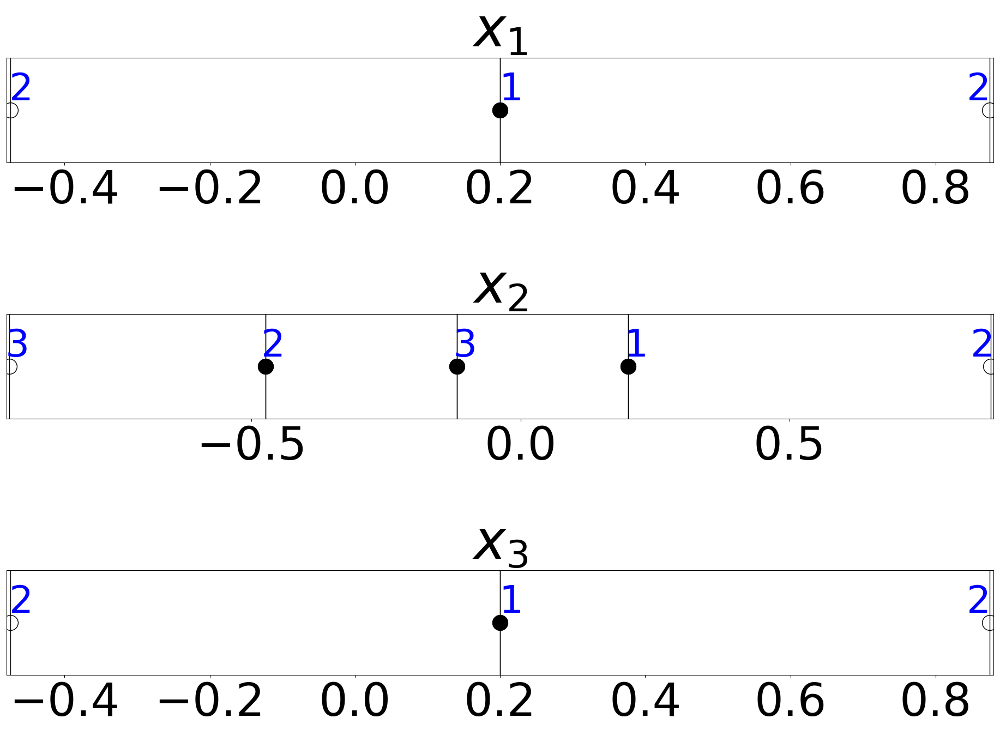

Combi Scheme:
Cannot print combischeme of dimension > 2
Resulting Sparse Grid:


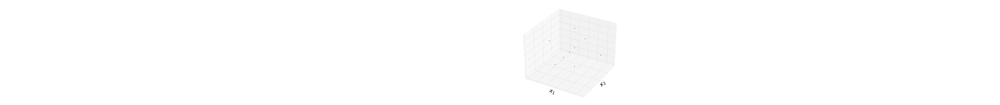

Current number of function evaluations 9
combiintegral: [2.45413256 9.60221232]
Current error: 22.55246817066399
Contour plot:
Can only plot 2D results
Finished refinement
Refined 2 times
Refinement Graph:


/home/djdaniel/anaconda3/envs/gene_ml/lib/python3.12/site-packages/sparseSpACE/spatiallyAdaptiveSingleDimension2.py:574: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.
  axis.plot(xValues[1:-1], yValues[1:-1], 'bo', markersize=markersize, color="black")
/home/djdaniel/anaconda3/envs/gene_ml/lib/python3.12/site-packages/sparseSpACE/spatiallyAdaptiveSingleDimension2.py:575: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.
  axis.plot([xValues[0], xValues[-1]], [yValues[0], yValues[-1]], 'bo', markersize=markersize, color="black", fillstyle='none')


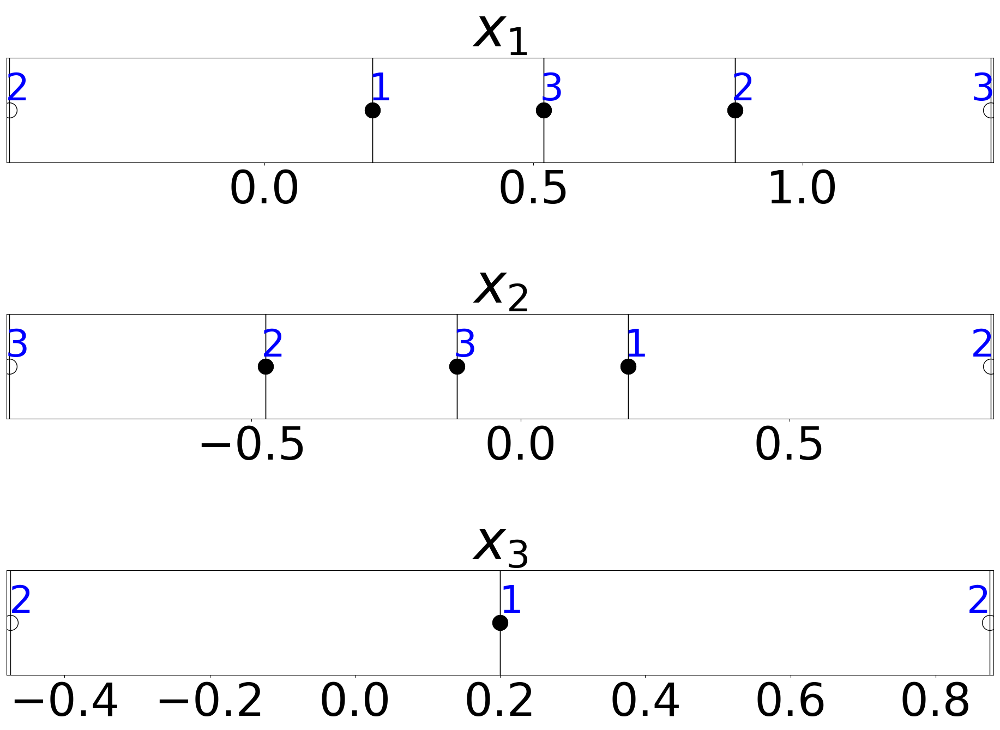

Combi Scheme:
Cannot print combischeme of dimension > 2
Resulting Sparse Grid:


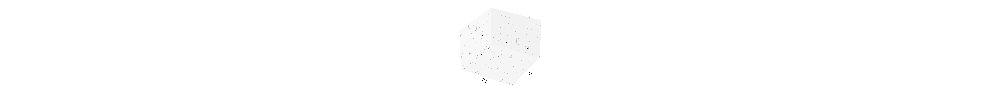

Current number of function evaluations 12
combiintegral: [ 2.57067026 12.99517061]
Current error: 13.932357258686048
Contour plot:
Can only plot 2D results
Finished refinement
Refined 2 times
Refinement Graph:


/home/djdaniel/anaconda3/envs/gene_ml/lib/python3.12/site-packages/sparseSpACE/spatiallyAdaptiveSingleDimension2.py:574: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.
  axis.plot(xValues[1:-1], yValues[1:-1], 'bo', markersize=markersize, color="black")
/home/djdaniel/anaconda3/envs/gene_ml/lib/python3.12/site-packages/sparseSpACE/spatiallyAdaptiveSingleDimension2.py:575: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.
  axis.plot([xValues[0], xValues[-1]], [yValues[0], yValues[-1]], 'bo', markersize=markersize, color="black", fillstyle='none')


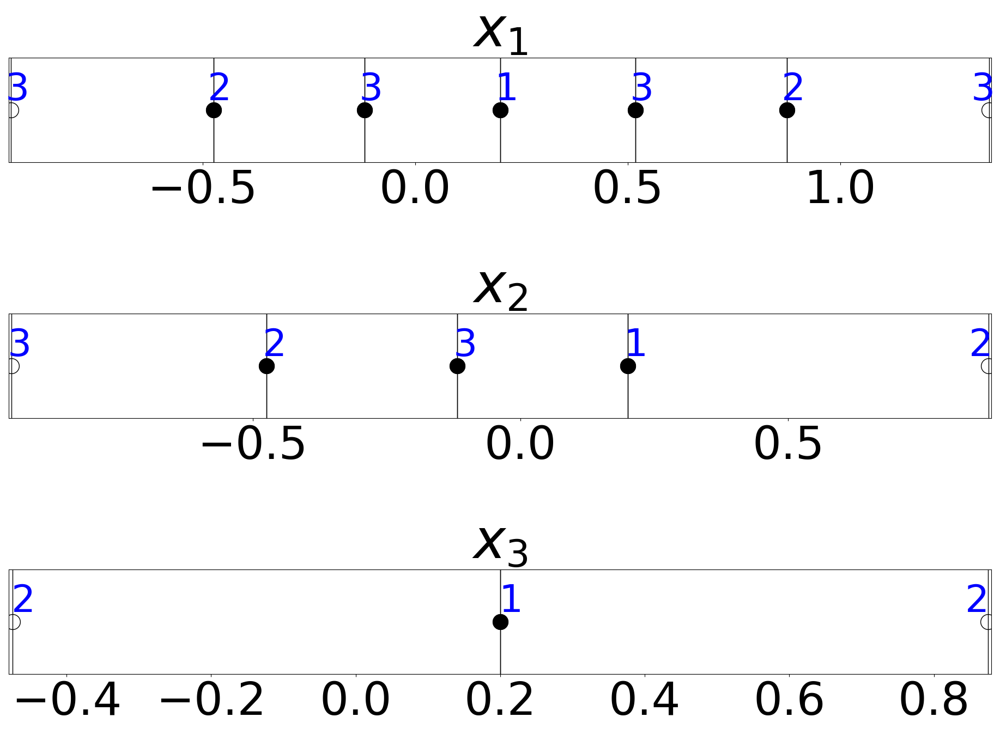

Combi Scheme:
Cannot print combischeme of dimension > 2
Resulting Sparse Grid:


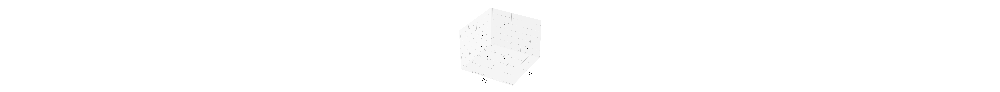

Current number of function evaluations 15
combiintegral: [ 2.29571566 11.56444994]
Current error: 13.849239402658618
Contour plot:
Can only plot 2D results
Finished refinement
Refined 2 times
Refinement Graph:


/home/djdaniel/anaconda3/envs/gene_ml/lib/python3.12/site-packages/sparseSpACE/spatiallyAdaptiveSingleDimension2.py:574: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.
  axis.plot(xValues[1:-1], yValues[1:-1], 'bo', markersize=markersize, color="black")
/home/djdaniel/anaconda3/envs/gene_ml/lib/python3.12/site-packages/sparseSpACE/spatiallyAdaptiveSingleDimension2.py:575: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.
  axis.plot([xValues[0], xValues[-1]], [yValues[0], yValues[-1]], 'bo', markersize=markersize, color="black", fillstyle='none')


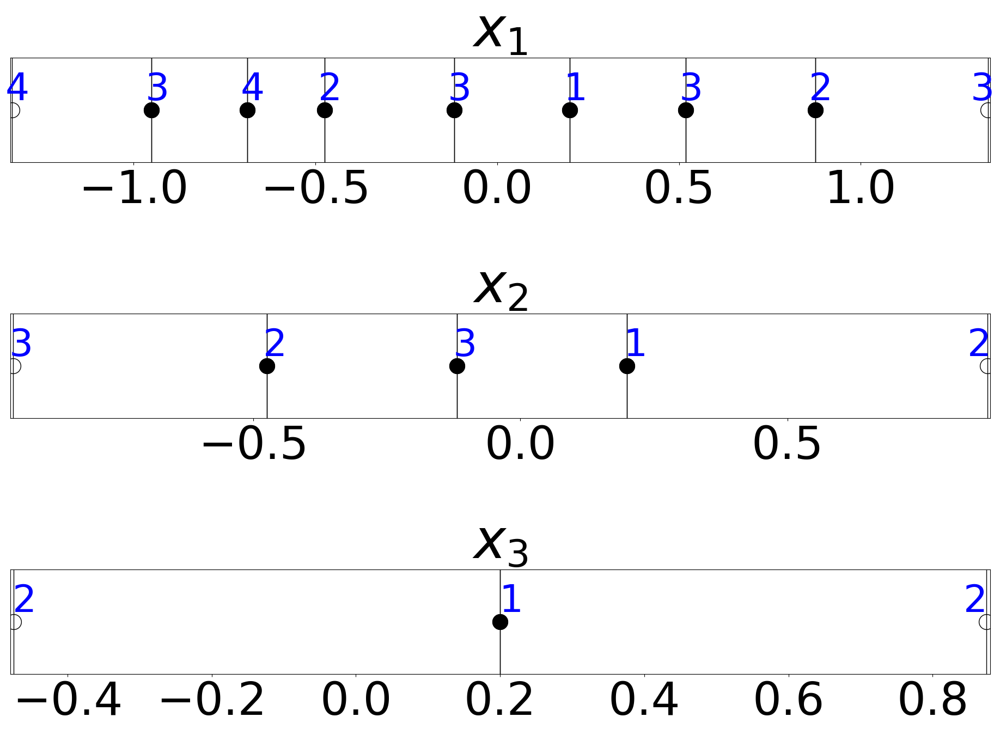

Combi Scheme:
Cannot print combischeme of dimension > 2
Resulting Sparse Grid:


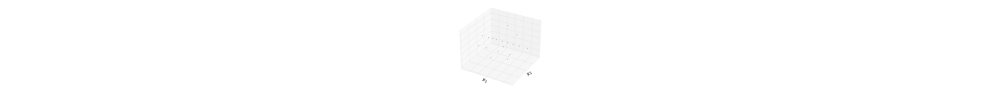

Current number of function evaluations 18
combiintegral: [ 2.33015877 12.52585178]
Current error: 11.598965979132657
Contour plot:
Can only plot 2D results
Finished refinement
Refined 4 times
Refinement Graph:


/home/djdaniel/anaconda3/envs/gene_ml/lib/python3.12/site-packages/sparseSpACE/spatiallyAdaptiveSingleDimension2.py:574: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.
  axis.plot(xValues[1:-1], yValues[1:-1], 'bo', markersize=markersize, color="black")
/home/djdaniel/anaconda3/envs/gene_ml/lib/python3.12/site-packages/sparseSpACE/spatiallyAdaptiveSingleDimension2.py:575: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.
  axis.plot([xValues[0], xValues[-1]], [yValues[0], yValues[-1]], 'bo', markersize=markersize, color="black", fillstyle='none')


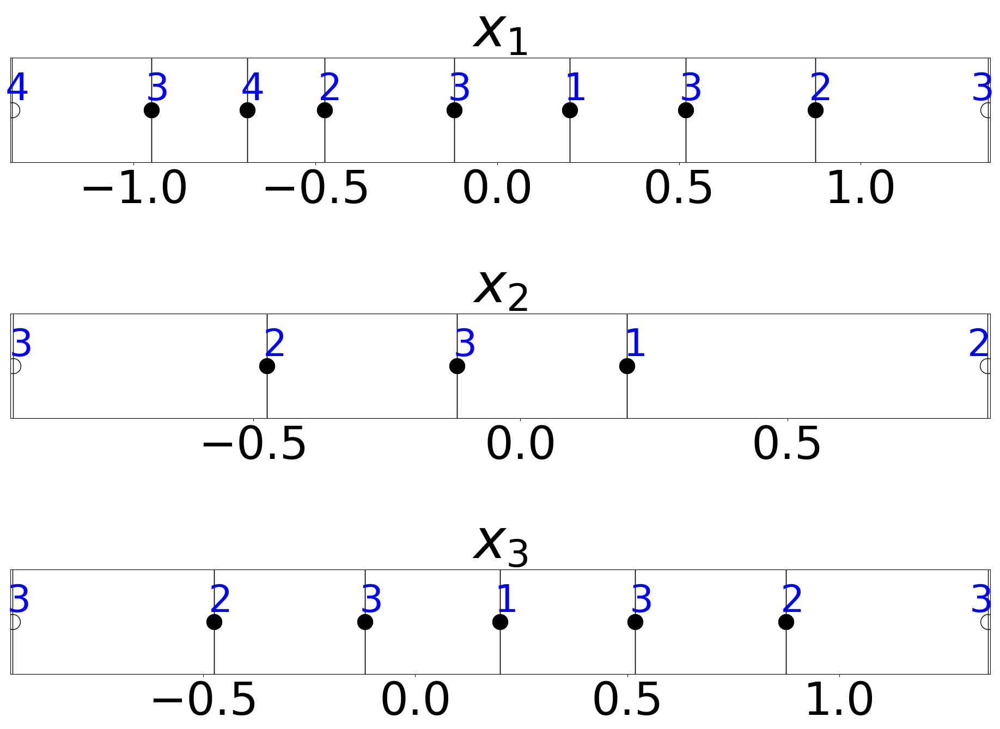

Combi Scheme:
Cannot print combischeme of dimension > 2
Resulting Sparse Grid:


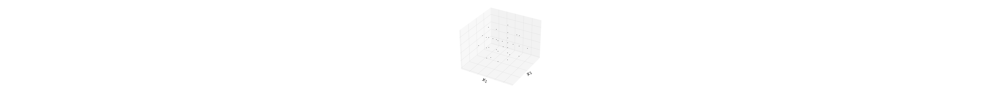

Current number of function evaluations 32
combiintegral: [ 2.33015877 12.81507496]
Current error: 8.380515342576881
Contour plot:
Can only plot 2D results
Finished refinement
Refined 2 times
Refinement Graph:


/home/djdaniel/anaconda3/envs/gene_ml/lib/python3.12/site-packages/sparseSpACE/spatiallyAdaptiveSingleDimension2.py:574: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.
  axis.plot(xValues[1:-1], yValues[1:-1], 'bo', markersize=markersize, color="black")
/home/djdaniel/anaconda3/envs/gene_ml/lib/python3.12/site-packages/sparseSpACE/spatiallyAdaptiveSingleDimension2.py:575: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.
  axis.plot([xValues[0], xValues[-1]], [yValues[0], yValues[-1]], 'bo', markersize=markersize, color="black", fillstyle='none')


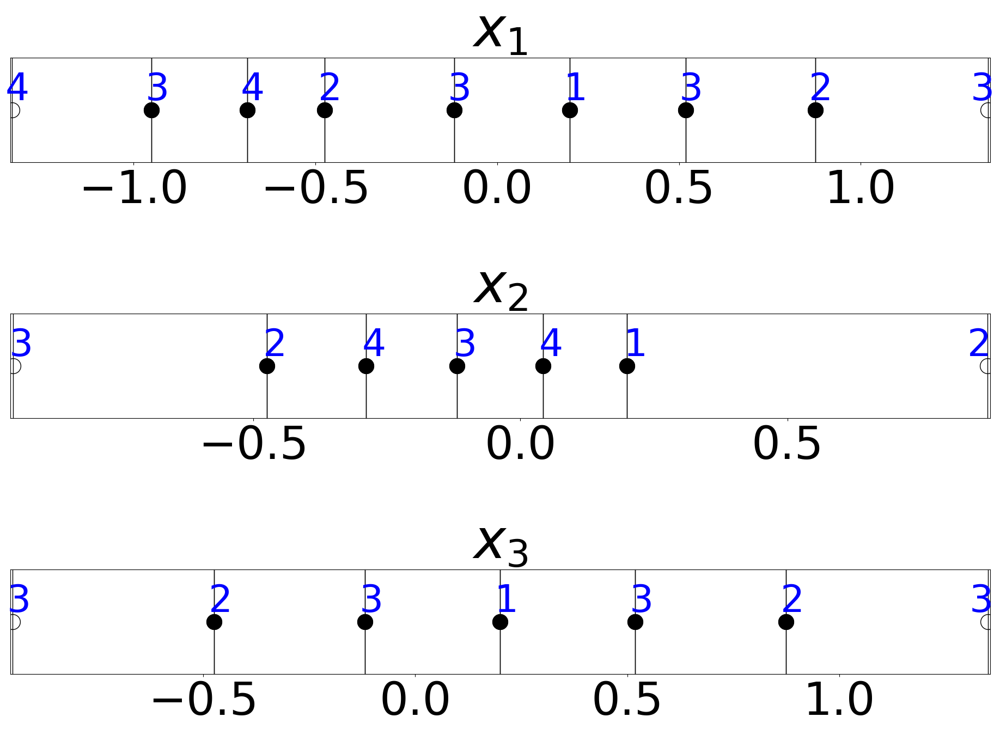

Combi Scheme:
Cannot print combischeme of dimension > 2
Resulting Sparse Grid:


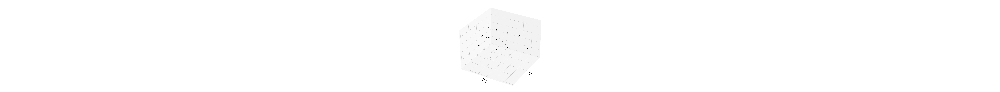

Current number of function evaluations 37
combiintegral: [ 2.57473698 14.85567598]
Current error: 7.020320281729539
Contour plot:
Can only plot 2D results
Finished refinement
Refined 2 times
Refinement Graph:


/home/djdaniel/anaconda3/envs/gene_ml/lib/python3.12/site-packages/sparseSpACE/spatiallyAdaptiveSingleDimension2.py:574: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.
  axis.plot(xValues[1:-1], yValues[1:-1], 'bo', markersize=markersize, color="black")
/home/djdaniel/anaconda3/envs/gene_ml/lib/python3.12/site-packages/sparseSpACE/spatiallyAdaptiveSingleDimension2.py:575: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.
  axis.plot([xValues[0], xValues[-1]], [yValues[0], yValues[-1]], 'bo', markersize=markersize, color="black", fillstyle='none')


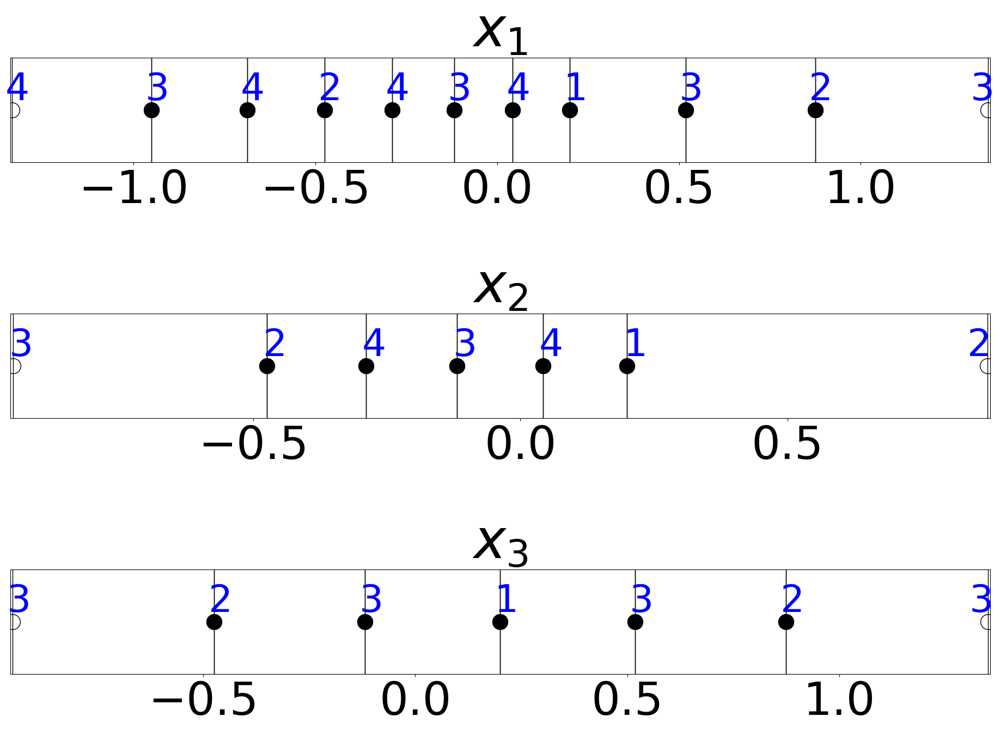

Combi Scheme:
Cannot print combischeme of dimension > 2
Resulting Sparse Grid:


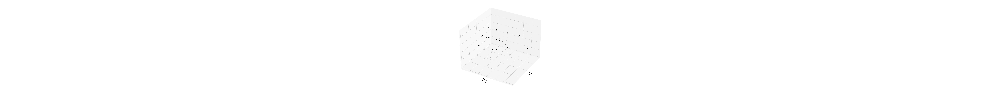

Current number of function evaluations 42
combiintegral: [ 2.562653   14.66555273]
Current error: 5.7660479962786395
Contour plot:
Can only plot 2D results
Finished refinement
Refined 2 times
Refinement Graph:


/home/djdaniel/anaconda3/envs/gene_ml/lib/python3.12/site-packages/sparseSpACE/spatiallyAdaptiveSingleDimension2.py:574: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.
  axis.plot(xValues[1:-1], yValues[1:-1], 'bo', markersize=markersize, color="black")
/home/djdaniel/anaconda3/envs/gene_ml/lib/python3.12/site-packages/sparseSpACE/spatiallyAdaptiveSingleDimension2.py:575: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.
  axis.plot([xValues[0], xValues[-1]], [yValues[0], yValues[-1]], 'bo', markersize=markersize, color="black", fillstyle='none')


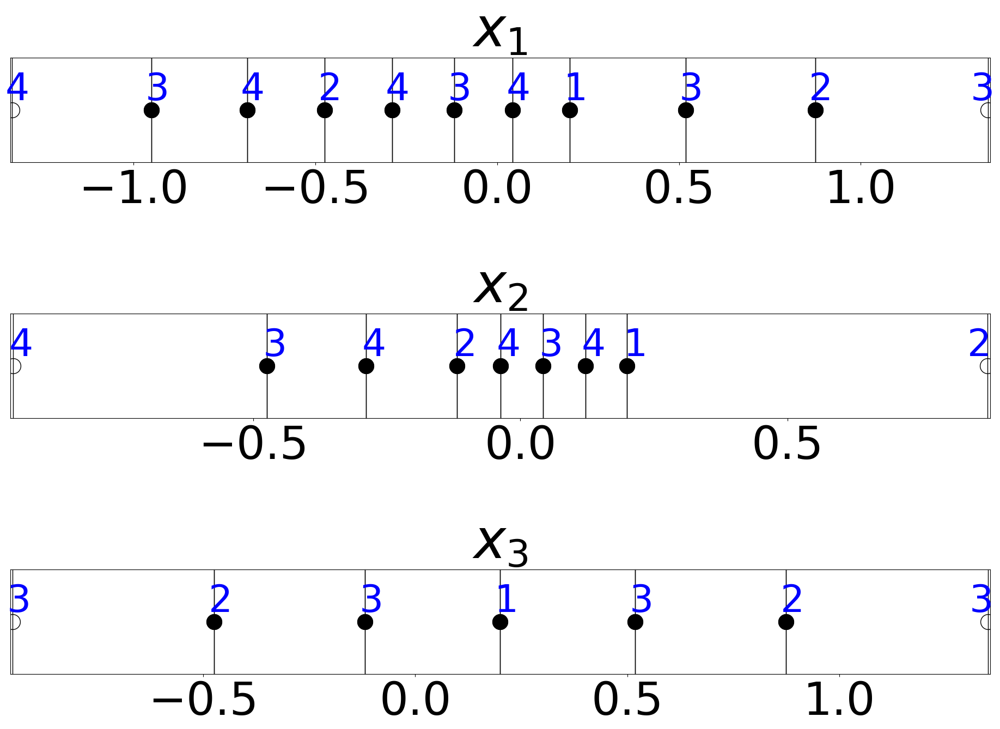

Combi Scheme:
Cannot print combischeme of dimension > 2
Resulting Sparse Grid:


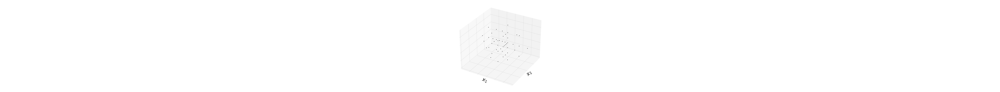

Current number of function evaluations 52
combiintegral: [ 2.55638415 14.87122742]
Current error: 5.032663972796612
Contour plot:
Can only plot 2D results
Finished refinement
Refined 2 times
Refinement Graph:


/home/djdaniel/anaconda3/envs/gene_ml/lib/python3.12/site-packages/sparseSpACE/spatiallyAdaptiveSingleDimension2.py:574: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.
  axis.plot(xValues[1:-1], yValues[1:-1], 'bo', markersize=markersize, color="black")
/home/djdaniel/anaconda3/envs/gene_ml/lib/python3.12/site-packages/sparseSpACE/spatiallyAdaptiveSingleDimension2.py:575: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.
  axis.plot([xValues[0], xValues[-1]], [yValues[0], yValues[-1]], 'bo', markersize=markersize, color="black", fillstyle='none')


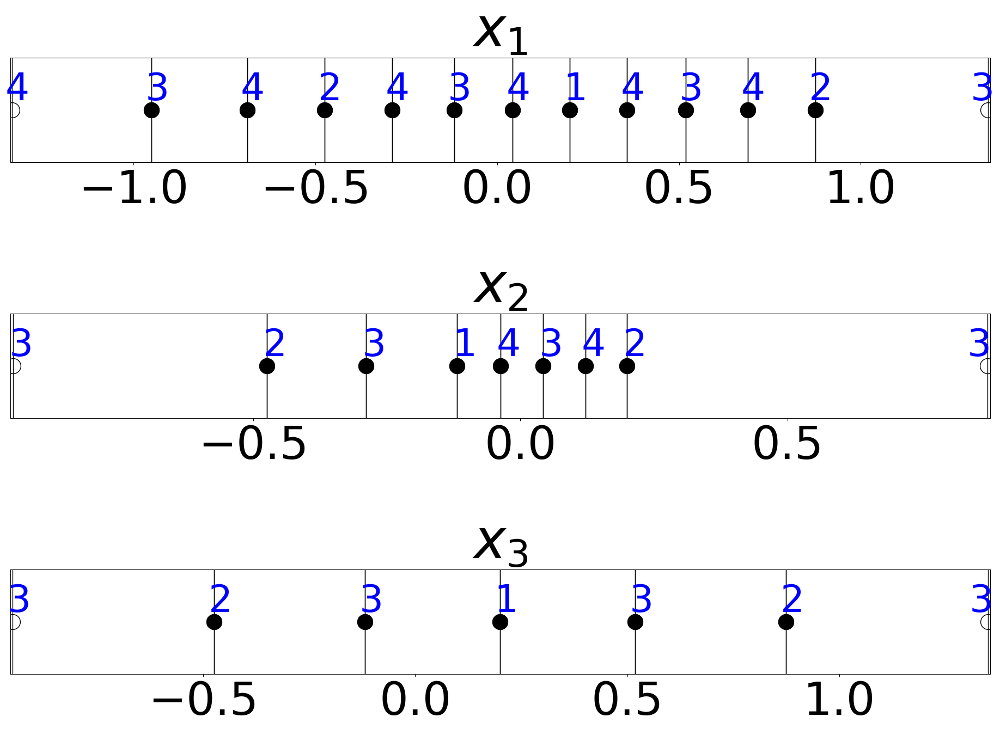

Combi Scheme:
Cannot print combischeme of dimension > 2
Resulting Sparse Grid:


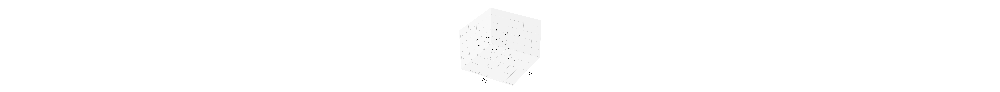

Current number of function evaluations 76
combiintegral: [ 3.03784209 17.06052169]
Current error: 3.748526892064571
Contour plot:
Can only plot 2D results
Finished refinement
Refined 2 times
Refinement Graph:


/home/djdaniel/anaconda3/envs/gene_ml/lib/python3.12/site-packages/sparseSpACE/spatiallyAdaptiveSingleDimension2.py:574: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.
  axis.plot(xValues[1:-1], yValues[1:-1], 'bo', markersize=markersize, color="black")
/home/djdaniel/anaconda3/envs/gene_ml/lib/python3.12/site-packages/sparseSpACE/spatiallyAdaptiveSingleDimension2.py:575: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.
  axis.plot([xValues[0], xValues[-1]], [yValues[0], yValues[-1]], 'bo', markersize=markersize, color="black", fillstyle='none')


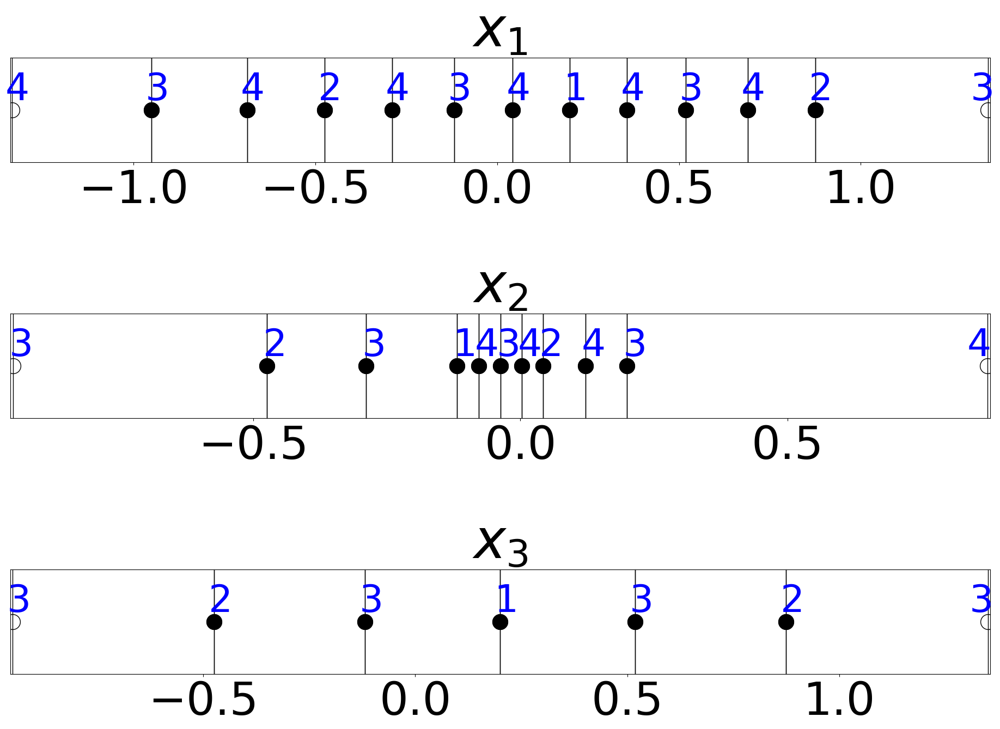

Combi Scheme:
Cannot print combischeme of dimension > 2
Resulting Sparse Grid:


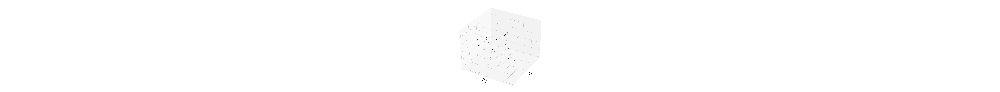

Current number of function evaluations 89
combiintegral: [ 3.10777804 17.689057  ]
Current error: 3.238506240125166
Contour plot:
Can only plot 2D results
Finished refinement
Refined 4 times
Refinement Graph:


/home/djdaniel/anaconda3/envs/gene_ml/lib/python3.12/site-packages/sparseSpACE/spatiallyAdaptiveSingleDimension2.py:574: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.
  axis.plot(xValues[1:-1], yValues[1:-1], 'bo', markersize=markersize, color="black")
/home/djdaniel/anaconda3/envs/gene_ml/lib/python3.12/site-packages/sparseSpACE/spatiallyAdaptiveSingleDimension2.py:575: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.
  axis.plot([xValues[0], xValues[-1]], [yValues[0], yValues[-1]], 'bo', markersize=markersize, color="black", fillstyle='none')


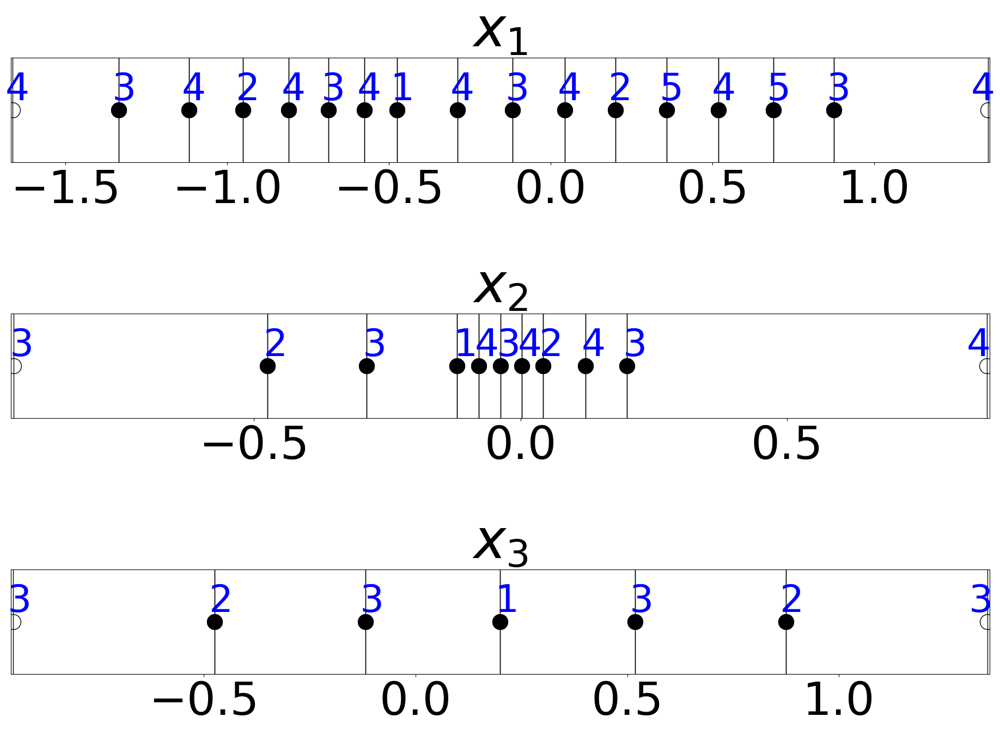

Combi Scheme:
Cannot print combischeme of dimension > 2
Resulting Sparse Grid:


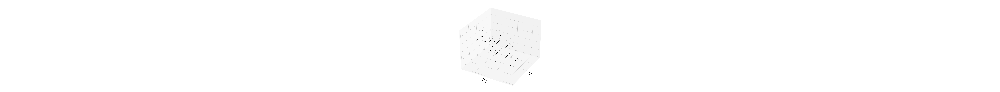

Current number of function evaluations 118
combiintegral: [ 3.01351774 17.12782598]
Current error: 2.0675714482105128
Contour plot:
Can only plot 2D results
Finished refinement
Refined 2 times
Refinement Graph:


/home/djdaniel/anaconda3/envs/gene_ml/lib/python3.12/site-packages/sparseSpACE/spatiallyAdaptiveSingleDimension2.py:574: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.
  axis.plot(xValues[1:-1], yValues[1:-1], 'bo', markersize=markersize, color="black")
/home/djdaniel/anaconda3/envs/gene_ml/lib/python3.12/site-packages/sparseSpACE/spatiallyAdaptiveSingleDimension2.py:575: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.
  axis.plot([xValues[0], xValues[-1]], [yValues[0], yValues[-1]], 'bo', markersize=markersize, color="black", fillstyle='none')


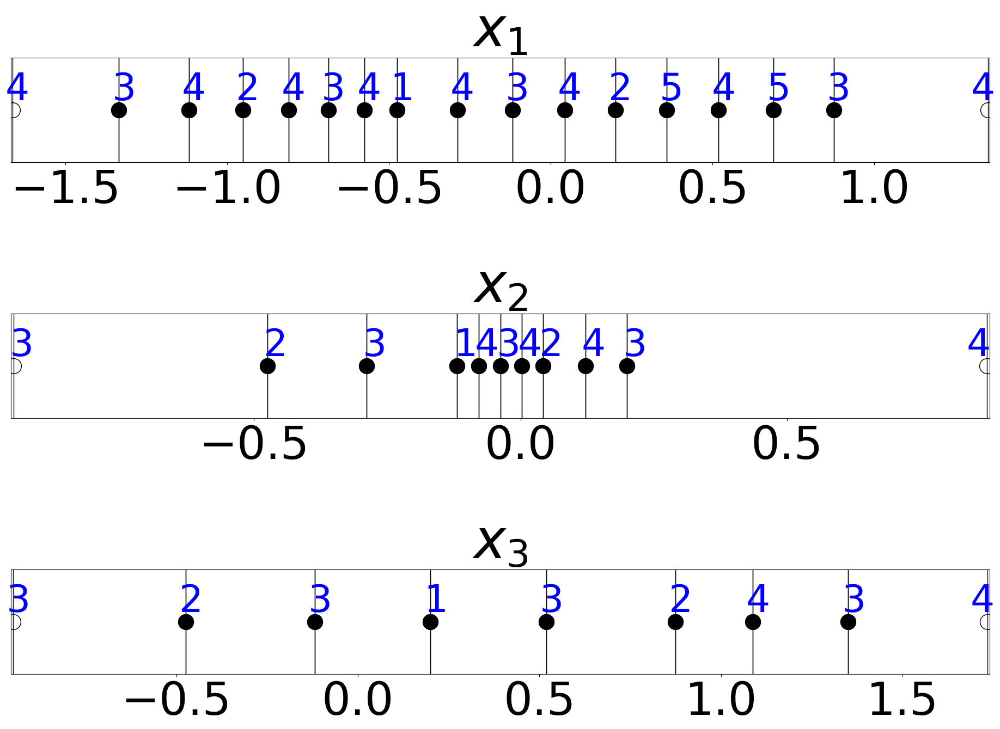

Combi Scheme:
Cannot print combischeme of dimension > 2
Resulting Sparse Grid:


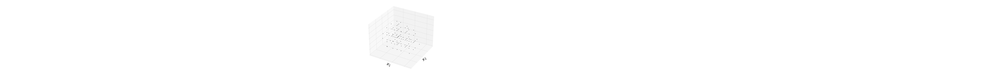

Current number of function evaluations 128
combiintegral: [ 3.04847619 17.89605593]
Current error: 1.711248218555005
Contour plot:
Can only plot 2D results
Finished refinement
Refined 2 times
Refinement Graph:


/home/djdaniel/anaconda3/envs/gene_ml/lib/python3.12/site-packages/sparseSpACE/spatiallyAdaptiveSingleDimension2.py:574: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.
  axis.plot(xValues[1:-1], yValues[1:-1], 'bo', markersize=markersize, color="black")
/home/djdaniel/anaconda3/envs/gene_ml/lib/python3.12/site-packages/sparseSpACE/spatiallyAdaptiveSingleDimension2.py:575: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.
  axis.plot([xValues[0], xValues[-1]], [yValues[0], yValues[-1]], 'bo', markersize=markersize, color="black", fillstyle='none')


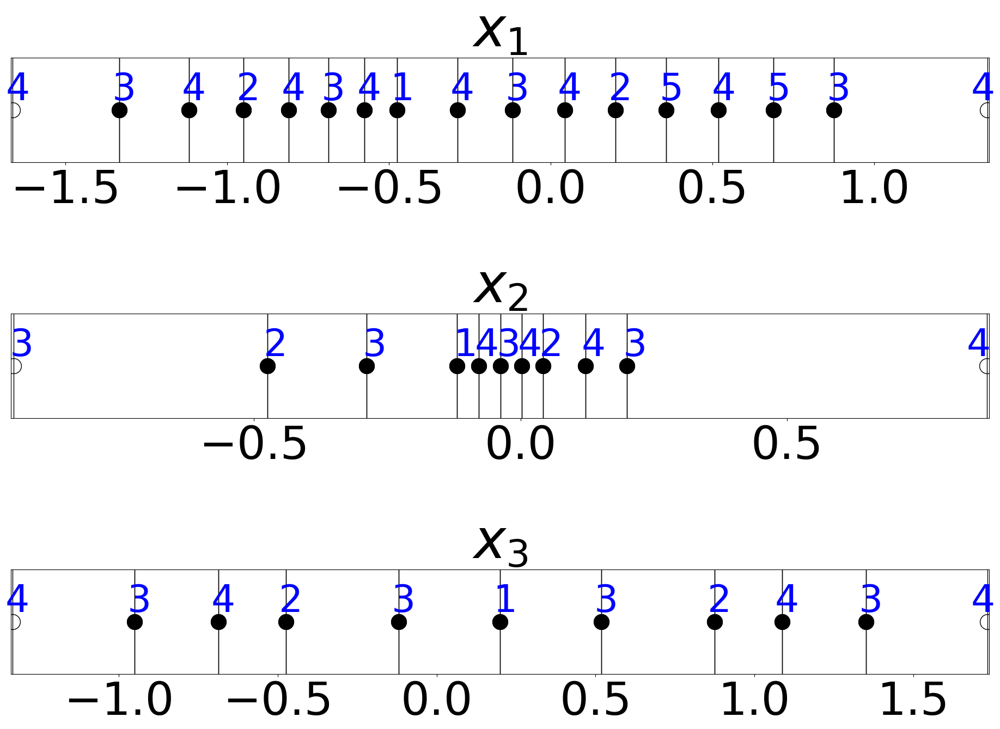

Combi Scheme:
Cannot print combischeme of dimension > 2
Resulting Sparse Grid:


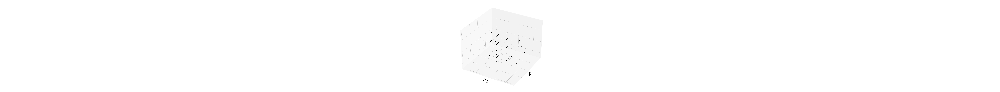

Current number of function evaluations 138
combiintegral: [ 3.01351774 17.30846012]
Current error: 1.3547671602738165
Contour plot:
Can only plot 2D results
Finished refinement
Refined 2 times
Refinement Graph:


/home/djdaniel/anaconda3/envs/gene_ml/lib/python3.12/site-packages/sparseSpACE/spatiallyAdaptiveSingleDimension2.py:574: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.
  axis.plot(xValues[1:-1], yValues[1:-1], 'bo', markersize=markersize, color="black")
/home/djdaniel/anaconda3/envs/gene_ml/lib/python3.12/site-packages/sparseSpACE/spatiallyAdaptiveSingleDimension2.py:575: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.
  axis.plot([xValues[0], xValues[-1]], [yValues[0], yValues[-1]], 'bo', markersize=markersize, color="black", fillstyle='none')


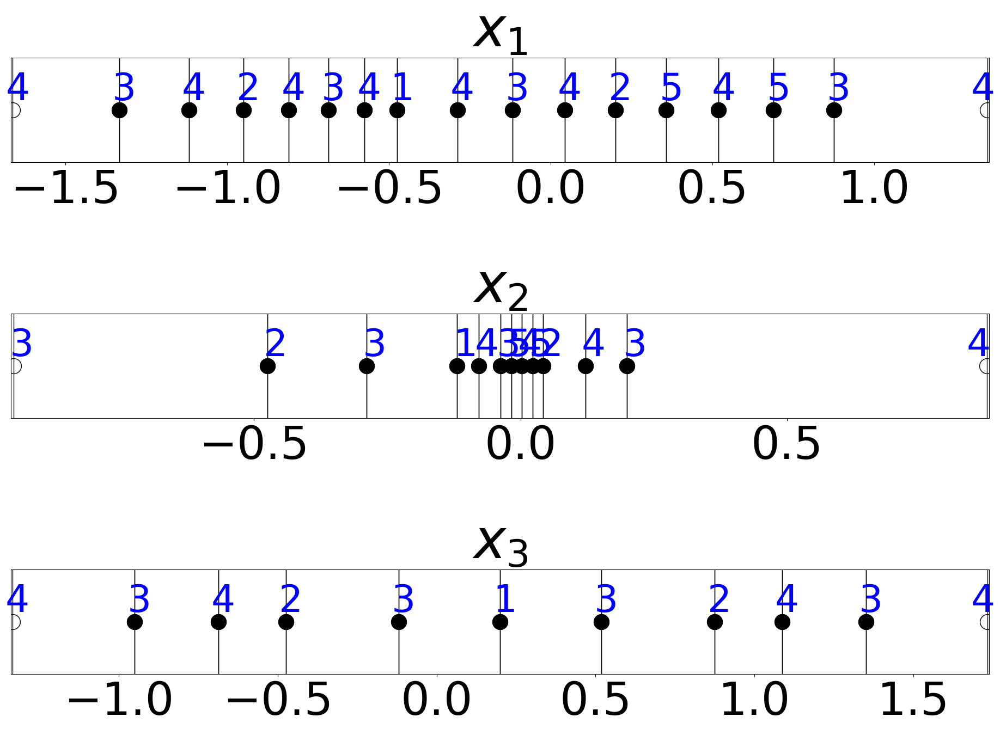

Combi Scheme:
Cannot print combischeme of dimension > 2
Resulting Sparse Grid:


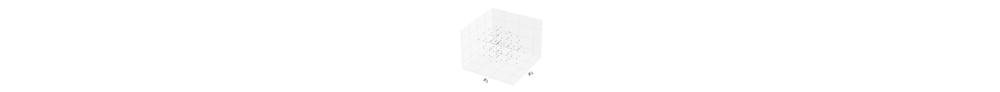

Current number of function evaluations 142
combiintegral: [ 2.9966174  17.24190146]
Current error: 1.2350137649283228
Contour plot:
Can only plot 2D results
Finished refinement
Refined 4 times
Refinement Graph:


/home/djdaniel/anaconda3/envs/gene_ml/lib/python3.12/site-packages/sparseSpACE/spatiallyAdaptiveSingleDimension2.py:574: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.
  axis.plot(xValues[1:-1], yValues[1:-1], 'bo', markersize=markersize, color="black")
/home/djdaniel/anaconda3/envs/gene_ml/lib/python3.12/site-packages/sparseSpACE/spatiallyAdaptiveSingleDimension2.py:575: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.
  axis.plot([xValues[0], xValues[-1]], [yValues[0], yValues[-1]], 'bo', markersize=markersize, color="black", fillstyle='none')


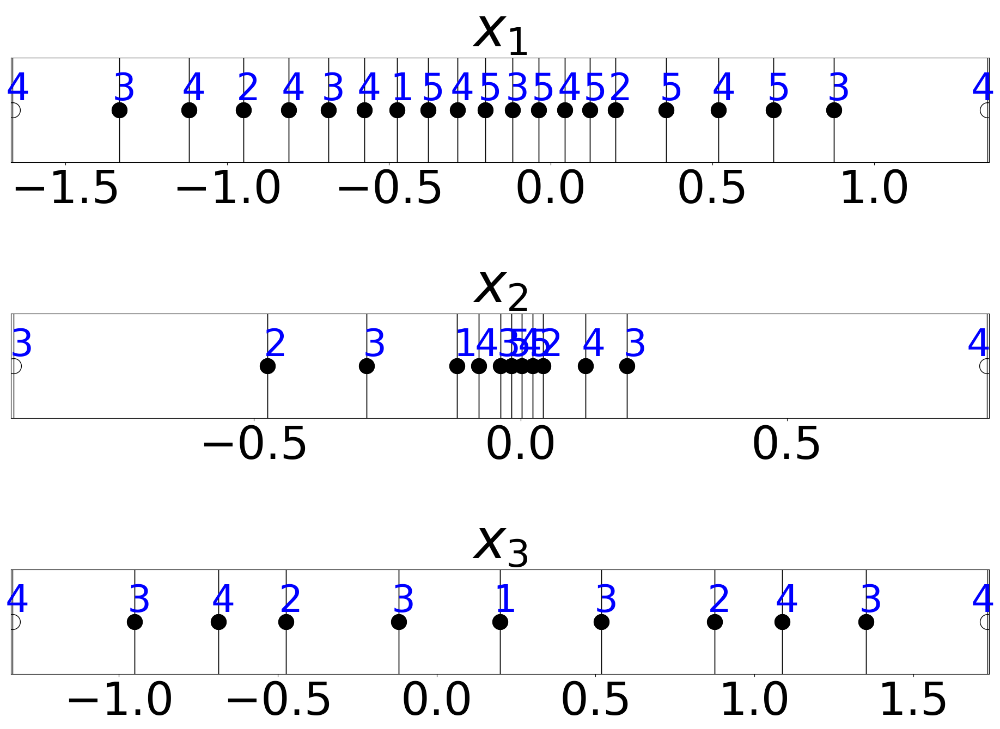

Combi Scheme:
Cannot print combischeme of dimension > 2
Resulting Sparse Grid:


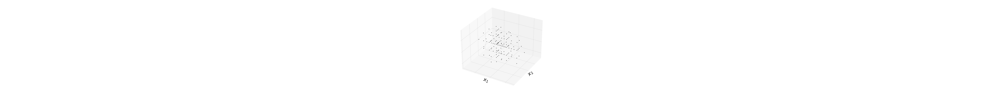

Current number of function evaluations 157
combiintegral: [ 3.00836738 17.39561398]
Current error: 0.9533213288912763
Contour plot:
Can only plot 2D results
Finished refinement
Refined 2 times
Refinement Graph:


/home/djdaniel/anaconda3/envs/gene_ml/lib/python3.12/site-packages/sparseSpACE/spatiallyAdaptiveSingleDimension2.py:574: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.
  axis.plot(xValues[1:-1], yValues[1:-1], 'bo', markersize=markersize, color="black")
/home/djdaniel/anaconda3/envs/gene_ml/lib/python3.12/site-packages/sparseSpACE/spatiallyAdaptiveSingleDimension2.py:575: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.
  axis.plot([xValues[0], xValues[-1]], [yValues[0], yValues[-1]], 'bo', markersize=markersize, color="black", fillstyle='none')


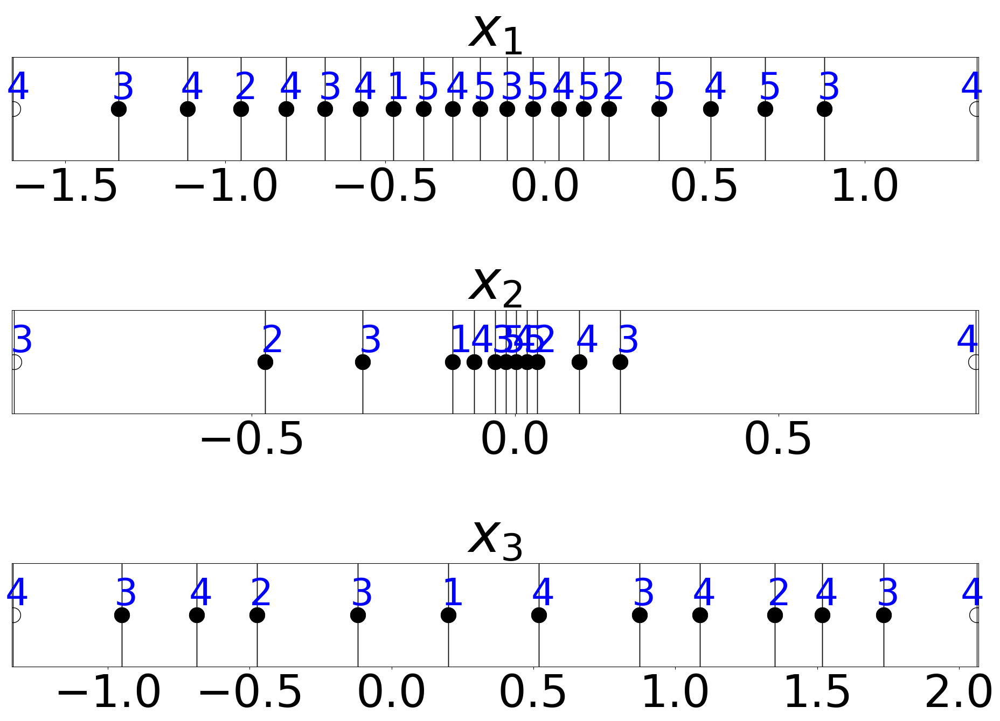

Combi Scheme:
Cannot print combischeme of dimension > 2
Resulting Sparse Grid:


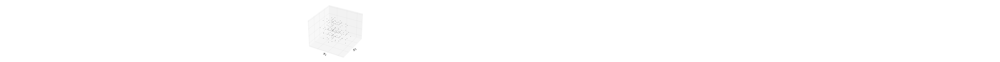

Current number of function evaluations 178
combiintegral: [ 3.02329757 17.5414589 ]
Current error: 0.8113491438835918
Contour plot:
Can only plot 2D results
Finished refinement
Refined 2 times
Refinement Graph:


/home/djdaniel/anaconda3/envs/gene_ml/lib/python3.12/site-packages/sparseSpACE/spatiallyAdaptiveSingleDimension2.py:574: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.
  axis.plot(xValues[1:-1], yValues[1:-1], 'bo', markersize=markersize, color="black")
/home/djdaniel/anaconda3/envs/gene_ml/lib/python3.12/site-packages/sparseSpACE/spatiallyAdaptiveSingleDimension2.py:575: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.
  axis.plot([xValues[0], xValues[-1]], [yValues[0], yValues[-1]], 'bo', markersize=markersize, color="black", fillstyle='none')


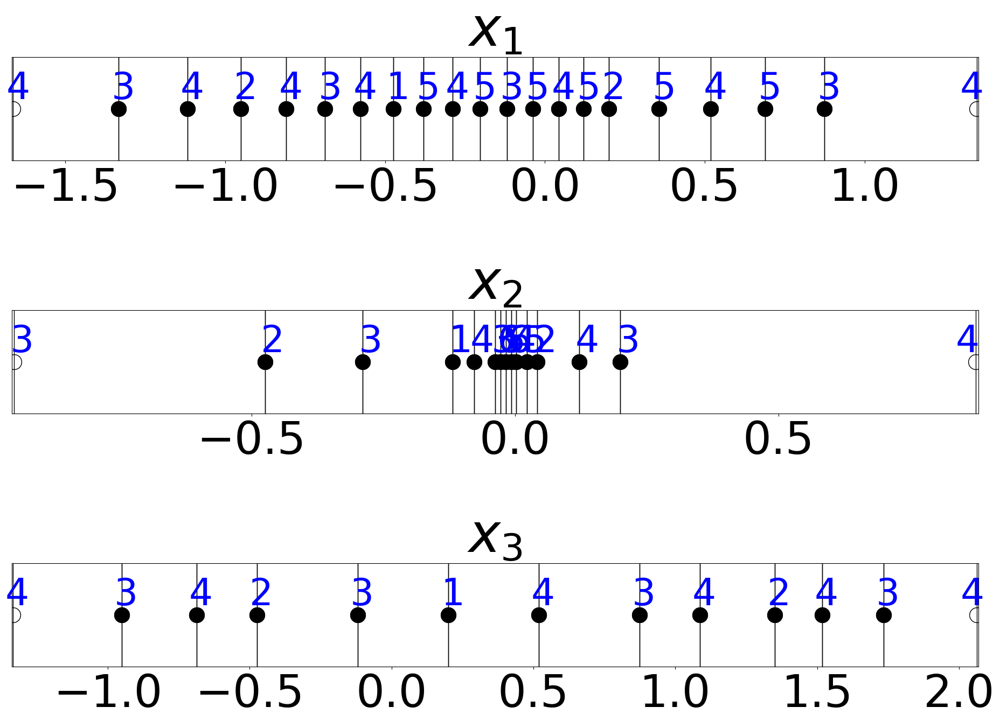

Combi Scheme:
Cannot print combischeme of dimension > 2
Resulting Sparse Grid:


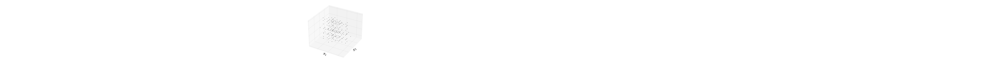

Current number of function evaluations 229
combiintegral: [ 2.996952   17.39243181]
Current error: 0.7064114881811632
Contour plot:
Can only plot 2D results
Number of refinements: 40
Number of distinct points used during the refinement: 229
Time used adaptive (s): 18.05702760799977
Final error: 0.7064114881811632
E: 2.9969520018895732, Var: 8.410710509436296


In [1]:

dim = 3
distributions = [("Normal", 0.2, 1.0) for _ in range(dim)]

# a and b are the weighted integration domain boundaries.
# They should be set according to the distribution.
a = np.array([-np.inf] * dim)
b = np.array([np.inf] * dim)


# Create the grid operation and the weighted grid
op = UncertaintyQuantification(problem_function, distributions, a, b)
grid = GlobalTrapezoidalGridWeighted(a, b, op, boundary=False)

# The grid initialization requires the weight functions from the
# operation; since currently the adaptive refinement takes the grid from
# the operation, it has to be passed here
op.set_grid(grid)

# Select the function for which the grid is refined;
# here it is the expectation and variance calculation via the moments
op.set_expectation_variance_Function()

# Initialize the adaptive refinement instance and refine the grid until
# it has at least 200 points
combiinstance = SpatiallyAdaptiveSingleDimensions2(a, b, operation=op, norm=2, grid_surplusses=grid)
lmax = 2
error_operator = ErrorCalculatorSingleDimVolumeGuided()
combiinstance.performSpatiallyAdaptiv(1, lmax,
    error_operator, tol=0, max_evaluations=200, do_plot=True)


# Calculate the expectation and variance with the adaptive sparse grid
# weighted integral result
(E,), (Var,) = op.calculate_expectation_and_variance(combiinstance)
print(f"E: {E}, Var: {Var}")

### PCE Coefficient Calculation

In the pseudo-spectral PCE, the calculation of a coefficient $a_k$ requires the integration of a polynomial $q_k$ with norm $n_k$ multiplied with the problem function $f$:
$$
a_k = \frac{1}{n_k} \int_{w \in \Omega} f(w) q_k(w) p(w) dw
$$
Now we need a `Function` for the refinement so that all coefficients can be calculated with the resulting sparse grid.
`UncertaintyQuantification` internally uses Chaospy in various ways to calculate the PCE function.

In [ ]:
%matplotlib inline
import numpy as np

import sparseSpACE
from sparseSpACE.Function import *
from sparseSpACE.spatiallyAdaptiveSingleDimension2 import *
from sparseSpACE.ErrorCalculator import *
from sparseSpACE.GridOperation import *

problem_function = FunctionUQ()
dim = 3
distributions = [("Normal", 0.2, 1.0) for _ in range(dim)]
a = np.array([-np.inf] * dim)
b = np.array([np.inf] * dim)
op = UncertaintyQuantification(problem_function, distributions, a, b)
grid = GlobalTrapezoidalGridWeighted(a, b, op, boundary=False)
op.set_grid(grid)


polynomial_degree_max = 2

# The grid needs to be refined for the PCE coefficient calculation
op.set_PCE_Function(polynomial_degree_max)


combiinstance = SpatiallyAdaptiveSingleDimensions2(a, b, operation=op, norm=2, grid_surplusses=grid)
lmax = 2
error_operator = ErrorCalculatorSingleDimVolumeGuided()
combiinstance.performSpatiallyAdaptiv(1, lmax,
    error_operator, tol=0, max_evaluations=200, do_plot=True)


# Create the PCE approximation; it is saved internally in the operation
op.calculate_PCE(None, combiinstance)

# Calculate the expectation, variance and sobol indices with the PCE coefficients
(E,), (Var,) = op.get_expectation_and_variance_PCE()
print(f"E: {E}, PCE Var: {Var}")
print("First order Sobol indices:", op.get_first_order_sobol_indices())
print("Total order Sobol indices:", op.get_total_order_sobol_indices())

### Custom Refinement Function

It is possible to choose an arbitrary function for the refinement. For example, we may be interested an accurate expectation and additionally print an approximate variance just for, let's say, debugging purposes. <br/>
To this end, we can take the code from the first example and change the refinement function and the `calculate_expectation_and_variance` invocation:

In [ ]:
%matplotlib inline
import numpy as np

import sparseSpACE
from sparseSpACE.Function import *
from sparseSpACE.spatiallyAdaptiveSingleDimension2 import *
from sparseSpACE.ErrorCalculator import *
from sparseSpACE.GridOperation import *

problem_function = FunctionUQ()
dim = 3
distributions = [("Normal", 0.2, 1.0) for _ in range(dim)]
a = np.array([-np.inf] * dim)
b = np.array([np.inf] * dim)
op = UncertaintyQuantification(problem_function, distributions, a, b)
grid = GlobalTrapezoidalGridWeighted(a, b, op, boundary=False)
op.set_grid(grid)

# The refinement function for the expectation/first moment 
# is simply the problem function

combiinstance = SpatiallyAdaptiveSingleDimensions2(a, b, operation=op, norm=2, grid_surplusses=grid)
lmax = 2
error_operator = ErrorCalculatorSingleDimVolumeGuided()
combiinstance.performSpatiallyAdaptiv(1, lmax,
    error_operator, tol=0, max_evaluations=200, do_plot=False)

# Calculate the expectation and variance, and inform the method that
# the integral obtained during refinement cannot be used because it
# only has the expectation
(E,), (Var,) = op.calculate_expectation_and_variance(combiinstance,
    use_combiinstance_solution=False)

print(f"E: {E}, Var: {Var}")